In [2]:
## location of the GED code
## use the '-S' option to use split JS divergence
GED = 'GED'
abcd_path = 'C:/Users/Brandon/.julia/packages/ABCDGraphGenerator/aMeu6/utils/'
## location of the node2vec code
n2v = 'C:/Users/Brandon/jupyter notebooks/DS 8014/Assignment 6/node2vec.exe'

In [35]:
import igraph as ig
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.linear_model import LinearRegression
from collections import Counter
import os
import umap.umap_ as umap
import pickle
import partition_igraph
import subprocess
import scipy.sparse.linalg as lg
from sklearn.cluster import KMeans, DBSCAN
from sklearn.model_selection import train_test_split
from sklearn.metrics import adjusted_mutual_info_score as AMI
from sklearn.metrics import adjusted_rand_score as ARI
from graphrole import RecursiveFeatureExtractor, RoleExtractor
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import calinski_harabasz_score as CHS
from sklearn.metrics import silhouette_score as SIL
from igraph import Graph
from geopy.distance import geodesic as GD
%config Completer.use_jedi = False

## node and edge greyscale colors
cls_edges = 'gainsboro'
cls = ['silver','dimgray','black']

In [4]:
## as defined in the node2vec paper
def binary_operator(u, v, op='had'):
    if op=='had':
        return u * v
    if op=='l1':
        return np.abs(u - v)
    if op=='l2':
        return (u - v) ** 2
    if op=='avg':
        return (u + v) / 2.0

## 'N2K' mapping is used to map between node name and key value in graph when reading results from node2vec
def readEmbedding(fn="_embed", N2K=None):
    D = pd.read_csv(fn, sep=' ', skiprows=1, header=None)
    D = D.dropna(axis=1)
    if N2K!=None:
        x = [N2K[i] for i in D[0]]
        D[0] = x    
        D = D.sort_values(by=0)
    Y = np.array(D.iloc[:,1:])
    return Y

## Read embedding from file in node2vec format
## Map to layout format
## for visualization, we use UMAP if dim > 2
def embed2layout(fn="_embed"):
    D = pd.read_csv(fn, sep=' ', skiprows=1, header=None)
    D = D.dropna(axis=1)
    D = D.sort_values(by=0)
    Y = np.array(D.iloc[:,1:])
    if Y.shape[1]>2:
        Y = umap.UMAP().fit_transform(Y)
    ly = []
    for v in range(Y.shape[0]):
        ly.append((Y[v][0],Y[v][1]))
    return ly


## Computing JS divergence with GED code given edgelist, communities and embedding
def JS(edge_file, comm_file, embed_file, entropy=False):
    if entropy:
        x = GED+' -E -g '+edge_file+' -c '+comm_file+' -e '+embed_file
    else:
        x = GED+' -g '+edge_file+' -c '+comm_file+' -e '+embed_file
    #print(x)
    s = subprocess.run(x, shell=True, stdout=subprocess.PIPE)
    x = s.stdout.decode().split(' ')
    #print(x)
    div = float(x[1])
    return(div)


## Hope embedding with various similarity functions
def Hope(g, sim='katz', dim=2, verbose=False, beta=.01, alpha=.5):
    ## For undirected graphs, embedding as source and target are identical
    if g.is_directed() == False:
        dim = dim*2
    A = np.array(g.get_adjacency().data)
    beta = beta
    alpha = alpha
    n = g.vcount()
    ## Katz
    if sim == 'katz':
        M_g = np.eye(n) - beta * A
        M_l = beta * A
    ## Adamic-Adar
    if sim == 'aa':
        M_g = np.eye(n)
        ## fix bug 1/x and take log();
        D = np.diag([1/np.log(x) if x>1 else 0 for x in g.degree()]) 
        # D = np.diag([1/np.log(max(2,x)) for x in g.degree()]) 
        M_l = np.dot(np.dot(A,D),A)
        np.fill_diagonal(M_l,0)
    ## Common neighbors
    if sim == 'cn':
        M_g = np.eye(n)
        M_l = np.dot(A,A)
    ## presonalized page rank
    if sim == 'ppr':
        P = []
        for i in range(n):
            s = np.sum(A[i])
            if s>0:
                P.append([x/s for x in A[i]])
            else:
                P.append([1/n for x in A[i]])
        P = np.transpose(np.array(P)) ## fix bug - take transpose
        M_g = np.eye(n)-alpha*P
        M_l = (1-alpha)*np.eye(n)
    S = np.dot(np.linalg.inv(M_g), M_l)
    u, s, vt = lg.svds(S, k=dim // 2)
    X1 = np.dot(u, np.diag(np.sqrt(s)))
    X2 = np.dot(vt.T, np.diag(np.sqrt(s)))
    X = np.concatenate((X1, X2), axis=1)
    p_d_p_t = np.dot(u, np.dot(np.diag(s), vt))
    eig_err = np.linalg.norm(p_d_p_t - S)
    if verbose:
        print('SVD error (low rank): %f' % eig_err)
    ## undirected graphs have identical source and target embeddings
    if g.is_directed() == False:
        d = dim//2
        return X[:,:d]
    else:
        return X

## save to disk to compute divergence
def saveEmbedding(X, g, fn='_embed'):
    with open(fn,'w') as f:
        f.write(str(X.shape[0]) + " " + str(X.shape[1])+'\n')
        for i in range(X.shape[0]):
            f.write(g.vs[i]['name']+' ')
            for j in range(X.shape[1]):
                f.write(str(X[i][j])+' ')
            f.write('\n')

## Laplacian eigenmaps embedding
def LE(g, dim=2):
    L_sym = np.array(g.laplacian(normalized=True))
    w, v = lg.eigs(L_sym, k=dim + 1, which='SM')
    idx = np.argsort(w) # sort eigenvalues
    w = w[idx]
    v = v[:, idx]
    X = v[:, 1:]
    return X.real

## Returns a LaTeX bmatrix
def bmatrix(a):
    if len(a.shape) > 2:
        raise ValueError('bmatrix can at most display two dimensions')
    lines = str(a).replace('[', '').replace(']', '').splitlines()
    rv = [r'\begin{bmatrix}']
    rv += ['  ' + ' & '.join(l.split()) + r'\\' for l in lines]
    rv +=  [r'\end{bmatrix}']
    return '\n'.join(rv)

## Question 1

In [23]:
cmd = 'julia '+abcd_path+'abcd_sampler.jl ' +abcd_path+'abcd_1000.toml'
os.system(cmd)
ABCD = ig.Graph.Read_Ncol('edge_1000.dat',directed=False)
c = np.loadtxt('com_1000.dat',dtype='uint16',usecols=(1))
ABCD.vs['comm'] = [c[int(x['name'])-1] for x in ABCD.vs]

## print a few stats
print(ABCD.vcount(),'vertices,',ABCD.ecount(),'edges,','avg degreee',np.mean(ABCD.degree()),
      'communities',max(ABCD.vs['comm']))

## ground truth communities
GT = {k:(v-1) for k,v in enumerate(ABCD.vs['comm'])}

## map between int(name) to key
N2K = {int(v):k for k,v in enumerate(ABCD.vs['name'])}\

## define the colors and node sizes here
## node colors refer to communities
cls_edges = 'gainsboro'
ABCD.vs['size'] = 5
ABCD.es['color'] = cls_edges
pal = ig.RainbowPalette(n=max(ABCD.vs['comm'])+1) 
ABCD.vs['color'] = [pal.get(int(i)) for i in ABCD.vs['comm']]
#ABCD.vs['color'] = 'black'

ig.plot(ABCD, bbox=(0,0,400,300)) ## communities are far from obvious in 2d layout!

1000 vertices, 10388 edges, avg degreee 20.776 communities 11


In [87]:
L = []
DIM = [4,8,16,32,64,128] ## embedding dimensions
best_jsd = 1           ## keep track of best result
worst_jsd = 0          ## and worst

## Hope with different choices for the similarity
for dim in DIM:
    for n in range(30):
        X = Hope(ABCD,sim='katz',dim=dim) 
        saveEmbedding(X,ABCD)
        jsd = JS('edge_1000.dat','com_1000.dat','_embed')
        ## keep track of best and worst
        if jsd < best_jsd:
            os.system('copy _embed _embed_best')
            best_jsd = jsd
        if jsd > worst_jsd:
            os.system('copy _embed _embed_worst')
            worst_jsd = jsd
        L.append([dim,'hope',jsd])


## node2vec 
for dim in DIM:
    for n in range(30):
        ## long walks:
        #x = n2v + ' -i:'+datadir+'ABCD/abcd_100.dat -o:_embed -d:'+str(dim)+' -p:'+str(p)+' -q:'+str(q)
        ## short walks:
        x = 'node2vec'+ ' -l:15 -i:edge_1000.dat -o:_embed -d:'+str(dim)+' -p:'+str(1)+' -q:'+str(0.5)
        r = os.system(x)
        jsd = JS('edge_1000.dat','com_1000.dat','_embed')
        ## keep track of best and worst
        if jsd < best_jsd:
            os.system('copy _embed _embed_best')
            best_jsd = jsd
        if jsd > worst_jsd:
            os.system('copy _embed _embed_worst')
            worst_jsd = jsd
        L.append([dim,'n2v',jsd])


In [88]:
## store in dataframe and show best results        
D = pd.DataFrame(L,columns=['dim','algo','jsd'])
result = D.groupby(['dim', 'algo']).agg({'jsd': ['mean', 'std']})
print(result)
#D = D.sort_values(by='jsd',axis=0)
#D.head()

               jsd          
              mean       std
dim algo                    
4   hope  0.003124  0.000000
    n2v   0.002838  0.000036
8   hope  0.003017  0.000000
    n2v   0.002716  0.000027
16  hope  0.002993  0.000000
    n2v   0.002712  0.000019
32  hope  0.002995  0.000000
    n2v   0.002704  0.000016
64  hope  0.003046  0.000000
    n2v   0.002691  0.000016
128 hope  0.003077  0.000000
    n2v   0.002699  0.000017


For the hope algorithm with the katz similarity function, the 16 dimension produced the best (lowest JSD) embedding, while all dimensions were equally stable (no standard deviation, deterministic)

For the n2v algorithm, the 64 dimension produced the best embedding, while the 32 ane 64 were the most stable (lowest standard deviation of JSD score)

## Question 2

In [103]:
## load the saved embedding
X1 = readEmbedding(fn="_embed_best")
X2 = readEmbedding(fn="_embed_worst")

L1 = [] ## to store results
L2 = []
K = [6,9,12,15,24] ## for k-means (real number of clusters is 12)

  
## run kmeans
for k in K:
    cl = KMeans(n_clusters=k).fit(X1)
    d = {k:v for k,v in enumerate(cl.labels_)}
    ami = AMI(list(GT.values()),list(d.values())) ## AMI vs ground truth
    ari = ARI(list(GT.values()),list(d.values())) ## ARI vs ground truth
    agri = ABCD.gam(GT, d) ## AGRI vs ground truth
    L1.append(['km'+str(k),ami, ari, agri])
        
## store in dataframe
D_best = pd.DataFrame(L1,columns=['algo','ami', 'ari', 'agri'])
D_best

,algo,ami,ari,agri
0,km6,0.011527,0.011646,-0.005211
1,km9,0.018006,0.009661,0.002621
2,km12,0.017764,0.009443,-0.001624
3,km15,0.015388,0.006193,-0.001438
4,km24,0.014703,0.003975,-0.001051


In [104]:
## run kmeans
for k in K:
    cl = KMeans(n_clusters=k).fit(X2)
    d = {k:v for k,v in enumerate(cl.labels_)}
    ami = AMI(list(GT.values()),list(d.values())) ## AMI vs ground truth
    ari = ARI(list(GT.values()),list(d.values())) ## ARI vs ground truth
    agri = ABCD.gam(GT, d) ## AGRI vs ground truth
    L2.append(['km'+str(k),ami, ari, agri])
        
## store in dataframe
D_worst = pd.DataFrame(L2,columns=['algo','ami', 'ari', 'agri'])
D_worst

,algo,ami,ari,agri
0,km6,0.470726,0.127143,0.314153
1,km9,0.633103,0.321980,0.285506
2,km12,0.633101,0.300760,0.226885
3,km15,0.626369,0.332510,0.154993
4,km24,0.587467,0.238003,0.108435


## Question 3

In [8]:
## n cliques of size s
def ringOfCliques(n,s):
    roc = ig.Graph.Erdos_Renyi(n=n*s,p=0)
    ## cliques
    for i in range(n):
        for j in np.arange(s*i,s*(i+1)):
            for k in np.arange(j+1,s*(i+1)):
                roc.add_edge(j,k)
    ## ring
    for i in range(n):
        if i>0:
            roc.add_edge(s*i-1,s*i)
        else:
            roc.add_edge(n*s-1,0)
    roc.vs['size'] = 8
    roc.vs['color'] = cls[2]
    roc.es['color'] = cls_edges
    return roc

## Ex: 10 3-cliques
roc = ringOfCliques(10,3)
roc.vs['name'] = [str(i) for i in range(roc.vcount())]
roc.vs['comm'] = [0,0,0,1,1,1,2,2,2,3,3,3,4,4,4,5,5,5,6,6,6,7,7,7,8,8,8,9,9,9]
#ig.plot(roc,'ring_3.eps',bbox=(0,0,300,300))     
#ig.plot(roc,bbox=(0,0,300,300))        

In [9]:
L = []
#DIM = [4,8,16,32,64,128] ## embedding dimensions

DIM = [4,8,16]

best_jsd = 1           ## keep track of best result
worst_jsd = 0          ## and worst

## Hope with different choices for the similarity
for dim in DIM:
    #print(dim)
    for n in range(30):
        #print(n)
        X = Hope(roc,sim='katz',dim=dim) 
        saveEmbedding(X,roc)
        jsd = JS('roc_edges.dat','roc_comms.dat','_embed')
        ## keep track of best and worst
        if jsd < best_jsd:
            os.system('copy _embed _embed_best')
            best_jsd = jsd
        if jsd > worst_jsd:
            os.system('copy _embed _embed_worst')
            worst_jsd = jsd
        L.append([dim,'hope',jsd])


## node2vec 
for dim in DIM:
    for n in range(30):
        ## long walks:
        ## short walks:
        x = 'node2vec'+ ' -l:15 -i:roc_edges.dat -o:_embed -d:'+str(dim)+' -p:'+str(1)+' -q:'+str(0.5)
        r = os.system(x)
        jsd = JS('roc_edges.dat','roc_comms.dat','_embed')
        ## keep track of best and worst
        if jsd < best_jsd:
            os.system('copy _embed _embed_best')
            best_jsd = jsd
        if jsd > worst_jsd:
            os.system('copy _embed _embed_worst')
            worst_jsd = jsd
        L.append([dim,'n2v',jsd])


In [10]:
## store in dataframe and show best results        
D = pd.DataFrame(L,columns=['dim','algo','jsd'])
result = D.groupby(['dim', 'algo']).agg({'jsd': ['mean', 'std']})
#print(result)
D = D.sort_values(by='jsd',axis=0)
#D.head()
D

,dim,algo,jsd
49,8,hope,0.000859
48,8,hope,0.000859
47,8,hope,0.000859
46,8,hope,0.000859
45,8,hope,0.000859
...,...,...,...
80,16,hope,0.006309
177,16,n2v,0.006493
165,16,n2v,0.007178
179,16,n2v,0.007785


# Hope algorithm with dimension 8 gave the best embedding with JSD score as the least.

In [23]:
## colors for different clusters
from random import randint
colors = []
for i in range(1000):
    colors.append('#%06X' % randint(0, 0xFFFFFF))
#print(colors)

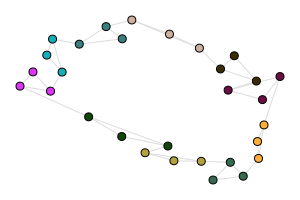

In [24]:
## ploting the best embedding after reducing to 2 dimensions using UMAP
os.system('cp _embed_best _embed')
l_best = embed2layout()
l_best_umap = umap.UMAP().fit_transform(l_best)
roc.vs['ly'] = [l_best[int(v['name'])] for v in roc.vs]
#ig.plot(z, 'zac_high.eps', layout=z.vs['ly'], bbox=(0,0,300,200))
roc.vs['color'] = [colors[i] for i in roc.vs['comm']]
ig.plot(roc,layout=roc.vs['ly'], bbox=(0,0,300,200))

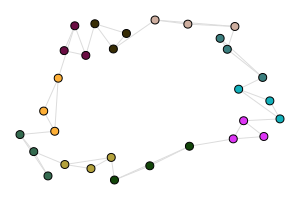

In [25]:
## ploting the worst embedding after reducing to 2 dimensions using UMAP
os.system('cp _embed_worst _embed')
l_wrst = embed2layout()
l_wrst_umap = umap.UMAP().fit_transform(l_wrst)
roc.vs['ly'] = [l_wrst[int(v['name'])] for v in roc.vs]
#ig.plot(z, 'zac_high.eps', layout=z.vs['ly'], bbox=(0,0,300,200))
roc.vs['color'] = [colors[i] for i in roc.vs['comm']]
ig.plot(roc,layout=roc.vs['ly'], bbox=(0,0,300,200))

# Q4
Repeat the above experiment (plotting the best and the worst em- bedding) for the giant component of the subset of the European Grid network used to generate Figure 1.1. Additionally,

In [26]:
## read edge list for the grid network and build undirected graph
gr = ig.Graph.Read_Ncol('gridkit_europe-highvoltage.edges', directed=False)
gr = gr.simplify()

## read the vertices along with some of the attributes
X = pd.read_csv('gridkit_europe-highvoltage.vertices')
idx = [int(i) for i in gr.vs['name']]
sorterIndex = dict(zip(idx,range(len(idx))))
X['Rank'] = X['v_id'].map(sorterIndex)
X.sort_values(['Rank'], ascending=[True],inplace=True)
X.dropna(inplace=True)
gr.vs['longitude'] = list(X['lon'])
gr.vs['latitude'] = list(X['lat'])
gr.vs['type'] = list(X['typ'])
gr.vs['layout'] = [(v['longitude'],v['latitude']) for v in gr.vs()] ## tuples with lat/lon
gr.vs['size'] = 5
gr.es['color'] = 'grey'
gr.vs['color'] = 'lightblue'
ig.plot(gr, bbox=(0,0,300,300))

In [27]:
print("Edges:",gr.ecount(),"\nNodes:",gr.vcount())

Edges: 17277 
Nodes: 13844


In [28]:
## subgraph of Grid -- Iberic peninsula
V = [v for v in gr.vs() if v['latitude']>36 and v['latitude']<44 and v['longitude']>-10 and v['longitude']<4]
gr_spain = gr.subgraph(V)
ly = ig.Layout(gr_spain.vs['layout'])
ly.mirror(1)
#print(gr_spain.vcount(),'nodes')
#ig.plot(gr_spain, 'grid_sg.eps', layout=ly, bbox=(0,0,300,300))
ig.plot(gr_spain, layout=ly, bbox=(0,0,300,300))
print("Edges:",gr_spain.ecount(),"\nNodes:",gr_spain.vcount())

Edges: 1980 
Nodes: 1562


Edges: 1962 
Nodes: 1537


C:\Users\Brandon\AppData\Local\Temp/ipykernel_5032/4276615211.py:2: DeprecationWarning: Graph.clusters() is deprecated; use Graph.connected_components() instead
  gr_giant = gr_spain.clusters().giant()


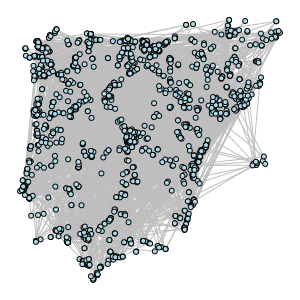

In [29]:
## Giant component of the Subgraph
gr_giant = gr_spain.clusters().giant()
gr_giant.vs['name'] = [str(i) for i in range(gr_giant.vcount())]
gr_giant.vs['size']=5
print("Edges:",gr_giant.ecount(),"\nNodes:",gr_giant.vcount())
ig.plot(gr_giant, layout=ly, bbox=(0,0,300,300))

In [36]:
## Creating edgelist for Grid network

file = open('grid_edges.edgelist','w')
#print(file)
Graph.write(gr_giant, file)
#print(file)

In [37]:
## Creating community structure file for Grid network

com_membership = gr_giant.community_edge_betweenness().as_clustering().membership
with open('grid_comms.community','w') as f:
    for i in range(gr_giant.vcount()):
        f.write(gr_giant.vs['name'][i]+' '+str(com_membership[i])+'\n')

In [38]:
L = [] ## to store results
#DIM = [4, 8, 16, 32, 64, 128]  ## try embedding in different dimensions
DIM = [4, 8, 16]
#DIM = [4, 8, 16, 32]

best_jsd = 1    ## keep track of best JS-divergence
worst_jsd = 0   ## and worst one.

## Hope with different choices for the similarity
for dim in DIM:
    for n in range(30):
        X = Hope(gr_giant,sim='katz',dim=dim) 
        saveEmbedding(X,gr_giant)
        jsd = JS('grid_edges.edgelist','grid_comms.community','_embed')        
        ## keep track of best and worst embeddings
        if jsd < best_jsd:
            os.system('cp _embed _embed_best')
            best_jsd = jsd
        if jsd > worst_jsd:
            os.system('cp _embed _embed_worst')
            worst_jsd = jsd
        L.append([dim,'hope',jsd])

    
## node2vec 
for dim in DIM:
    for n in range(30):
        ## long walks:
        ## short walks (10-long):
        x = n2v + ' -l:10 -i:grid_edges.edgelist -o:_embed -d:'+str(dim)+' -p:'+str(1)+' -q:'+str(0.5)
        r = os.system(x+' >/dev/null 2>&1')
        jsd = JS('grid_edges.edgelist','grid_comms.community','_embed')

        ## keep track of best and worst embeddings
        if jsd < best_jsd:
            os.system('cp _embed _embed_best')
            best_jsd = jsd
        if jsd > worst_jsd:
            os.system('cp _embed _embed_worst')
            worst_jsd = jsd
        
        ## store results
        L.append([dim,'n2v',jsd])

In [39]:
## store results in dataframe, show top results w.r.t. JS divergence (lower is better)        
D = pd.DataFrame(L,columns=['dim','algo','jsd'])
D = D.sort_values(by='jsd',axis=0)
#D.head()
D

,dim,algo,jsd
89,16,hope,0.000476
115,4,n2v,0.000476
116,4,n2v,0.000476
117,4,n2v,0.000476
118,4,n2v,0.000476
...,...,...,...
27,4,hope,0.000482
28,4,hope,0.000482
29,4,hope,0.000482
15,4,hope,0.000482


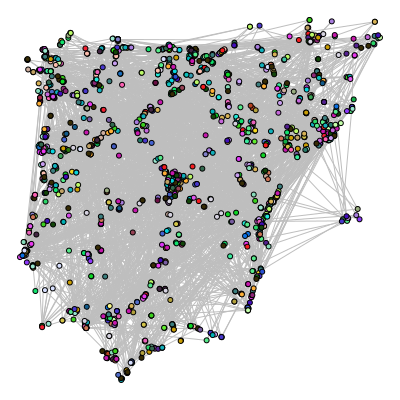

In [40]:
## Applying ECG algorithm to find the communities and coloring the nodes accordingly
gr_giant.vs['comm'] = gr_giant.community_ecg().membership
gr_giant.vs['color'] = [colors[i] for i in gr_giant.vs['comm']]
ig.plot(gr_giant, layout=ly, bbox=(0,0,400,400))

# 4b)
for each pair of nodes, compute the distance in the embedded space and the geographical distance and create a scatter plot,

In [41]:
File_data = np.loadtxt("_embed_best", skiprows=1, dtype=float)
D_embed = pd.read_csv('_embed_best', sep=' ', skiprows=1, header=None)
D_embed.head()

,0,1,2,3,4,5,6,7,8,9
0,0,3.131121e-02,-0.037570,-0.004481,-0.036718,0.022254,0.007926,-0.045344,0.033281,NaN
1,1,-3.606988e-17,-0.034556,0.007693,-0.033309,0.010057,0.001443,-0.034499,0.024363,NaN
2,2,-3.131121e-02,-0.032120,0.019997,-0.042899,0.001785,-0.004113,-0.045847,0.033281,NaN
3,3,3.131121e-02,0.007348,0.037116,-0.032511,-0.028045,-0.020240,-0.041343,0.033281,NaN
4,4,-2.798321e-17,0.017995,0.030487,-0.019858,-0.028571,-0.019111,-0.028759,0.024363,NaN


In [42]:
D_embed.dropna(axis=1, how='all', inplace=True)
#D_embed.head()
D

,dim,algo,jsd
89,16,hope,0.000476
115,4,n2v,0.000476
116,4,n2v,0.000476
117,4,n2v,0.000476
118,4,n2v,0.000476
...,...,...,...
27,4,hope,0.000482
28,4,hope,0.000482
29,4,hope,0.000482
15,4,hope,0.000482


In [43]:
dimen = len(D_embed.columns)
nl = len(D_embed)
X = []
Y = []
for i in range(nl):
    for j in range(nl-1):
        # Calculating distance in embedded space
        point1 = D_embed.iloc[i, 1:dimen]
        point2 = D_embed.iloc[j, 1:dimen]
        dist = np.linalg.norm(point1 - point2)
        print(dist)
        X.append(dist)
        
        # Calculating the geographical distance
        vertex1 = gr_giant.vs[i]['latitude'],gr_giant.vs[i]['longitude']
        vertex2 = gr_giant.vs[j]['latitude'],gr_giant.vs[j]['longitude']
        geo_distance = GD(vertex1,vertex2).km
        print(geo_distance)
        Y.append(geo_distance)



0.0
0.0
0.039207688134667094
14.776561993648906
0.07178302029621579
860.6954125311381
0.08429059588394974
820.9253313434958
0.09614436114416192
329.4825238457924
0.12300939626300392
317.41739285205205
0.12156275672143209
579.7356606515025
0.11761502231118419
579.7047935319953
0.1374920973414096
142.8903361528996
0.11297726805281728
138.25674186685998
0.1040035990059611
768.9571725295835
0.12541049787688024
765.408580747055
0.11041827021878037
349.63945985356656
0.1066105373878928
347.4870179645241
0.1303454280527529
177.866936644293
0.11917156178109106
181.63951713534354
0.11355834265881744
478.05111195614666
0.13344115391794123
471.3699334626916
0.11041827021878037
669.1236349663125
0.10297136824643713
677.6009943889198
0.12519539143523895
631.2817238604291
0.11297726805281716
631.8094633705598
0.1092866848922297
594.6266364467285
0.1335333399713467
600.2237257718181
0.12156275672143205
558.6503343424288
0.11493904862078838
545.7264280389924
0.12971716961078672
467.79381172646924
0.08

0.10400359900596119
744.0097817879954
0.08933242289135669
225.38375738700054
0.1374920973414096
142.8903361528996
0.11761502231118398
138.808313626565
0.12156275672143198
1003.4534555900957
0.12300939626300363
963.759065552059
0.09614436114416174
469.622969523071
0.08429059588394983
456.93275590452663
0.07178302029621536
643.4340648284768
0.03920768813466663
643.4373536380663
0.0
0.0
0.08396690173709812
15.049387261090864
0.07517224935103053
911.5274591775036
0.08429059588394974
908.0048570769906
0.12971716961078628
484.3351474688715
0.11493904862078821
482.05003264459424
0.12156275672143196
93.82044252453093
0.13353333997134634
94.38086238442746
0.10928668489222969
527.7205296789988
0.11297726805281712
522.3854012255949
0.12519539143523864
744.0943635138597
0.10297136824643693
752.8627463620396
0.11041827021878026
739.943544053935
0.13344115391794104
738.4477461133349
0.11355834265881723
695.9966623813392
0.11917156178109102
707.1786516196286
0.1303454280527529
700.0335462991674
0.106

0.12156275672143202
808.7020199674545
0.11761502231118402
769.0543390373306
0.13749209734140969
777.1694503482007
0.11297726805281723
730.5408686833903
0.10400359900596094
718.7661027568797
0.12541049787688038
598.5394490696895
0.11041827021878031
598.8167380220278
0.10661053738789275
520.6300752221027
0.11355834265881744
478.05111195614666
0.09890604989208354
492.7382554418609
0.1135583426588174
867.6302361729821
0.1066105373878927
868.7651513246883
0.08785688945617283
446.06964559153323
0.10297136824643707
434.6868552479986
0.10400359900596103
124.44115487478216
0.08933242289135665
124.4987513420553
0.10928668489222969
527.7205296789988
0.11761502231118409
537.7857688976409
0.10277316838056606
843.9541385306555
0.1149390486207882
839.7303456053227
0.09614436114416178
395.0766357246399
0.07355047268119023
393.454184007591
0.07517224935103069
615.3773743135466
0.039207688134666706
617.2608790939264
0.0
0.0
0.039207688134666845
7.871450982735612
0.07517224935103065
236.00924310044786
0.

0.12156275672143196
566.1248146103045
0.11493904862078838
569.3210032835325
0.1297171696107867
365.9375538342278
0.08429059588394988
379.08509066193653
0.07517224935103077
396.685536284551
0.08396690173709898
364.96841583765803
0.0
0.0
0.039207688134667226
17.750208519835297
0.0717830202962163
275.88511984648943
0.08429059588394987
275.93687642951124
0.09614436114416201
596.0706773206414
0.11493904862078838
545.7264280389924
0.10277316838056608
553.1512450535022
0.11761502231118406
328.870654948129
0.10928668489222969
310.41074702455217
0.08933242289135662
217.28731315232312
0.10400359900596098
230.54825812769536
0.10297136824643705
555.1630454518806
0.08785688945617282
555.011089451074
0.10661053738789263
686.6833911618663
0.11355834265881737
683.6036348865864
0.09890604989208354
278.3115368945994
0.11355834265881717
274.09174437677365
0.10661053738789274
217.88437860003512
0.08785688945617277
220.378354275475
0.10297136824643696
714.5343520806441
0.10400359900596094
718.7661027568797

In [44]:
df = pd.DataFrame({'Embedding Distance' : X,
                                'Geo Distance' : Y}, 
                                columns=['Embedding Distance','Geo Distance'])

In [45]:
df.head()

,Embedding Distance,Geo Distance
0,0.000000,0.000000
1,0.039208,14.776562
2,0.071783,860.695413
3,0.084291,820.925331
4,0.096144,329.482524


In [46]:
data = df.sort_values(by=['Embedding Distance'])

In [47]:
data

,Embedding Distance,Geo Distance
0,0.000000,0.000000
450,0.000000,0.000000
420,0.000000,0.000000
60,0.000000,0.000000
30,0.000000,0.000000
...,...,...
862,0.137492,408.719124
172,0.137492,277.681646
788,0.137492,277.681646
698,0.137492,312.582505


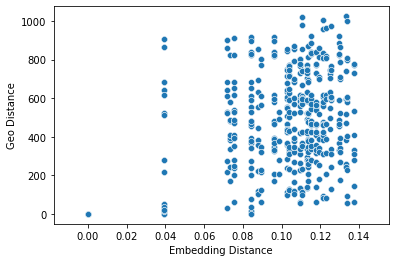

In [48]:
## Plotting the embed distance and geographical distance between each pair of nodes

x = [data["Embedding Distance"]]
y= [data["Geo Distance"]]
sns.scatterplot(data = data, x="Embedding Distance", y="Geo Distance")

# 4c)
partition all pairs of nodes into 10 buckets of equal size based on their distance (that is, the first bucket consists of pairs of nodes that are close to each other and the last one pairs of nodes that are far from each other); compute the number of edges that fall into each bucket. What can you conclude?


(array([ 29.,   0.,  39.,   0.,   0.,  78., 136., 186., 269., 133.]),
 array([0.        , 0.01374921, 0.02749842, 0.04124763, 0.05499684,
        0.06874605, 0.08249526, 0.09624447, 0.10999368, 0.12374289,
        0.1374921 ]),
 <a list of 10 Patch objects>)

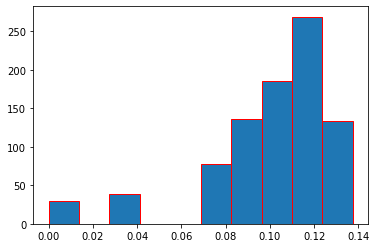

In [49]:
fig, ax = plt.subplots(1,1)
ax.hist(x, edgecolor="red", bins=10)

In [50]:
heights = []
for i in range(len(ax.patches)):
    heights.append(["Bin "+str(i+1), ax.patches[i].get_height()])
    #print(ax.patches[i].get_height())

In [51]:
Num_edges = pd.DataFrame(heights,columns=['Bin #','Number of Edges'])
Num_edges

,Bin #,Number of Edges
0,Bin 1,29.0
1,Bin 2,0.0
2,Bin 3,39.0
3,Bin 4,0.0
4,Bin 5,0.0
5,Bin 6,78.0
6,Bin 7,136.0
7,Bin 8,186.0
8,Bin 9,269.0
9,Bin 10,133.0


# From the histogram above, it is clear that there are less number of node pairs which are close to each other, and there are more node pairs which are far from each other.